In [36]:
import json
import numpy as np
import glob
import os
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import pandas as pd
from matplotlib.colors import ListedColormap
from matplotlib import rc
import random

In [2]:
# matplotlib 한글 폰트 깨짐 문제 해결
import matplotlib.font_manager as fm
font_path = '/usr/share/fonts/opentype/noto/NotoSansCJK-Regular.ttc'
fontprop = fm.FontProperties(fname=font_path)

#### 파일 업로드

In [3]:
# 경로 설정

data_path = '/workspace/#Ub370#Uc774#Ud130/Data'

train_img_path = '/workspace/#Ub370#Uc774#Ud130/Data/img/train/'
val_img_path = '/workspace/#Ub370#Uc774#Ud130/Data/img/val/'

train_json_path = '/workspace/#Ub370#Uc774#Ud130/Data/label/train/'
val_json_path = '/workspace/#Ub370#Uc774#Ud130/Data/label/val/'

train_segment_path = '/workspace/#Ub370#Uc774#Ud130/Data/segmentation/train/'
val_segment_path = '/workspace/#Ub370#Uc774#Ud130/Data/segmentation/val/'


In [4]:
# 라벨 정보 json 파일 
# json_anger, json_happy, json_panic, json_sadness

with open (train_json_path + "train_anger.json", "r", encoding='euc-kr') as f:
    json_anger = json.load(f)

with open (train_json_path + "train_happy.json", "r", encoding='euc-kr') as f:
    json_happy = json.load(f)

with open (train_json_path + "train_panic.json", "r", encoding='euc-kr') as f:
    json_panic = json.load(f)

with open (train_json_path + "train_sadness.json", "r", encoding='euc-kr') as f:
    json_sadness = json.load(f)

In [5]:
# Segmentation 정보 npz 파일
# npz_anger, npz_happy, npz_panic, npz_sadness

npz_anger = np.load(train_segment_path + 'train_anger.npz')
npz_happy = np.load(train_segment_path + 'train_happy.npz')
npz_panic = np.load(train_segment_path + 'train_panic.npz')
npz_sadness = np.load(train_segment_path + 'train_sadness.npz')

### JSON 파일

In [6]:
json_anger[0]

{'filename': '6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63ec1162f5f6bfc6e481l.jpg',
 'gender': '남',
 'age': 30,
 'isProf': '일반인',
 'faceExp_uploader': '분노',
 'bg_uploader': '교통/이동수단(엘리베이터 포함)',
 'annot_A': {'boxes': {'maxX': 2073.2546049999996,
   'maxY': 1486.204442,
   'minX': 1338.2201049999999,
   'minY': 539.5066419999999},
  'faceExp': '분노',
  'bg': '교통/이동수단(엘리베이터 포함)'},
 'annot_B': {'boxes': {'maxX': 2074.6636049999997,
   'maxY': 1490.044442,
   'minX': 1341.270105,
   'minY': 528.132642},
  'faceExp': '분노',
  'bg': '교통/이동수단(엘리베이터 포함)'},
 'annot_C': {'boxes': {'maxX': 2072.188605,
   'maxY': 1487.918442,
   'minX': 1340.0851049999999,
   'minY': 525.650642},
  'faceExp': '분노',
  'bg': '교통/이동수단(엘리베이터 포함)'}}

In [7]:
# Json 파일 -> DataFrame 변환
# df_train_anger, df_train_happy, df_train_panic, df_train_sadness

# 데이터 변환 함수 정의
def process_data(data):
    processed_data = []
    for item in data:
        base_info = {
            'filename': item.get('filename'),
            'gender': item.get('gender'),
            'age': item.get('age'),
            'isProf': item.get('isProf'),
            'faceExp_uploader': item.get('faceExp_uploader'),
            'bg_uploader': item.get('bg_uploader'),
        }

        # annot_A, annot_B, annot_C 데이터 추가
        for annot_key in ['annot_A', 'annot_B', 'annot_C']:
            annot = item.get(annot_key, {})
            row = {
                **base_info,
                'annot': annot_key,
                'faceExp': annot.get('faceExp'),
                'bg': annot.get('bg'),
                'minX': annot.get('boxes', {}).get('minX'),
                'minY': annot.get('boxes', {}).get('minY'),
                'maxX': annot.get('boxes', {}).get('maxX'),
                'maxY': annot.get('boxes', {}).get('maxY'),
            }
            processed_data.append(row)
    return pd.DataFrame(processed_data)

# 데이터프레임 생성
df_train_anger = process_data(json_anger)
df_train_happy = process_data(json_happy)
df_train_panic = process_data(json_panic)
df_train_sadness = process_data(json_sadness)


##### 이미지와 json 파일 내 filename이 일치하는 지 확인

In [8]:
anger_img_path = train_img_path + 'anger'

IMAGE_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff', '.webp'}

# 폴더 내 이미지 파일 개수 세기
def count_images_in_folder(folder_path):
    image_count = 0
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if os.path.splitext(file)[1].lower() in IMAGE_EXTENSIONS:
                image_count += 1
    return image_count

image_count = count_images_in_folder(anger_img_path)
print(f"폴더 내 이미지 파일 개수: {image_count}")
print(f"json 파일 길이 : {len(json_anger)}")

폴더 내 이미지 파일 개수: 1500
json 파일 길이 : 1500


In [9]:
# 폴더 내 이미지 파일 이름 수집
def get_image_files_in_folder(folder_path):
    image_files = set()
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if os.path.splitext(file)[1].lower() in IMAGE_EXTENSIONS:
                image_files.add(file)
    return image_files

# JSON 파일 내 이미지 파일 이름 수집
def get_image_files_in_json(json_file):
    json_filenames = {entry["filename"] for entry in json_file}
    return json_filenames

# 비교 수행
image_files_in_folder = get_image_files_in_folder(anger_img_path)
image_files_in_json = get_image_files_in_json(json_anger)

# 누락된 파일 찾기
missing_in_json = image_files_in_folder - image_files_in_json
missing_in_folder = image_files_in_json - image_files_in_folder

# 결과 출력 
print(f"JSON 파일에 없는 폴더 내 이미지 파일: {missing_in_json}")
print(f"폴더에 없는 JSON 파일의 이미지 파일: {missing_in_folder}")

JSON 파일에 없는 폴더 내 이미지 파일: set()
폴더에 없는 JSON 파일의 이미지 파일: set()


#### Train Anger

In [10]:
df_train_anger.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4500 entries, 0 to 4499
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   filename          4500 non-null   object 
 1   gender            4500 non-null   object 
 2   age               4500 non-null   int64  
 3   isProf            4500 non-null   object 
 4   faceExp_uploader  4500 non-null   object 
 5   bg_uploader       4500 non-null   object 
 6   annot             4500 non-null   object 
 7   faceExp           4500 non-null   object 
 8   bg                4500 non-null   object 
 9   minX              4500 non-null   float64
 10  minY              4500 non-null   float64
 11  maxX              4500 non-null   float64
 12  maxY              4500 non-null   float64
dtypes: float64(4), int64(1), object(8)
memory usage: 457.2+ KB


In [11]:
df_train_anger

,filename,gender,age,isProf,faceExp_uploader,bg_uploader,annot,faceExp,bg,minX,minY,maxX,maxY
0,6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63...,남,30,일반인,분노,교통/이동수단(엘리베이터 포함),annot_A,분노,교통/이동수단(엘리베이터 포함),1338.220105,539.506642,2073.254605,1486.204442
1,6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63...,남,30,일반인,분노,교통/이동수단(엘리베이터 포함),annot_B,분노,교통/이동수단(엘리베이터 포함),1341.270105,528.132642,2074.663605,1490.044442
2,6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63...,남,30,일반인,분노,교통/이동수단(엘리베이터 포함),annot_C,분노,교통/이동수단(엘리베이터 포함),1340.085105,525.650642,2072.188605,1487.918442
3,65rsfe402042f34319e10128c1ab9614e2f967690a64a0...,남,40,전문인,분노,문화재 및 유적지,annot_A,분노,행사/사무공간,1812.222817,711.278453,2889.526926,2306.348256
4,65rsfe402042f34319e10128c1ab9614e2f967690a64a0...,남,40,전문인,분노,문화재 및 유적지,annot_B,분노,공공시설/종교/의료,1816.913391,688.002830,2875.110464,2311.339041
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4495,88oia7ac423f30f3767186eca94cc04702847519a7c16a...,여,20,일반인,분노,교통/이동수단(엘리베이터 포함),annot_B,불안,교통/이동수단(엘리베이터 포함),1086.115200,239.490170,1779.042200,1090.823700
4496,88oia7ac423f30f3767186eca94cc04702847519a7c16a...,여,20,일반인,분노,교통/이동수단(엘리베이터 포함),annot_C,분노,교통/이동수단(엘리베이터 포함),1086.115200,239.490170,1779.042200,1090.823700
4497,kwo3ff0f613a3d10de39c62d6afed70c2ca9c6fe1dc378...,남,30,전문인,분노,도심 환경,annot_A,분노,도심 환경,880.070201,372.811888,1810.692143,1651.235196
4498,kwo3ff0f613a3d10de39c62d6afed70c2ca9c6fe1dc378...,남,30,전문인,분노,도심 환경,annot_B,불안,도심 환경,866.405365,356.502016,1820.077641,1646.159980


##### 표정 데이터 확인
- faceExp_uploader (image) 와 faceExp (annot) 차이 확인
- 표정 정보가 다른 이미지들 어떻게 처리할지

In [12]:
df_train_anger['faceExp_uploader'].value_counts()

faceExp_uploader
분노    4500
Name: count, dtype: int64

In [13]:
df_train_anger['faceExp'].value_counts()

faceExp
분노    3187
불안     450
슬픔     227
중립     207
상처     198
당황     197
기쁨      34
Name: count, dtype: int64

In [14]:
# faceExp가 분노가 아닌 데이터 추출
def process_non_anger_data(data):
    processed_data = []
    for item in data:
        base_info = {
            'filename': item.get('filename'),
            'gender': item.get('gender'),
            'age': item.get('age'),
            'isProf': item.get('isProf'),
            'faceExp_uploader': item.get('faceExp_uploader'),
            'bg_uploader': item.get('bg_uploader'),
        }

        # Process each annotation and filter for non-anger faceExp
        for annot_key in ['annot_A', 'annot_B', 'annot_C']:
            annot = item.get(annot_key, {})
            face_exp = annot.get('faceExp')
            if face_exp != "분노":  # Only include non-anger faceExp
                row = {
                    **base_info,
                    'annot': annot_key,
                    'faceExp': face_exp,
                    'bg': annot.get('bg'),
                    'minX': annot.get('boxes', {}).get('minX'),
                    'minY': annot.get('boxes', {}).get('minY'),
                    'maxX': annot.get('boxes', {}).get('maxX'),
                    'maxY': annot.get('boxes', {}).get('maxY'),
                }
                processed_data.append(row)
    return pd.DataFrame(processed_data)

df_train_not_anger = process_non_anger_data(json_anger)

In [15]:
df_train_not_anger.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1313 entries, 0 to 1312
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   filename          1313 non-null   object 
 1   gender            1313 non-null   object 
 2   age               1313 non-null   int64  
 3   isProf            1313 non-null   object 
 4   faceExp_uploader  1313 non-null   object 
 5   bg_uploader       1313 non-null   object 
 6   annot             1313 non-null   object 
 7   faceExp           1313 non-null   object 
 8   bg                1313 non-null   object 
 9   minX              1313 non-null   float64
 10  minY              1313 non-null   float64
 11  maxX              1313 non-null   float64
 12  maxY              1313 non-null   float64
dtypes: float64(4), int64(1), object(8)
memory usage: 133.5+ KB


In [16]:
df_train_not_anger

,filename,gender,age,isProf,faceExp_uploader,bg_uploader,annot,faceExp,bg,minX,minY,maxX,maxY
0,b1cbe34734870cc11c33334e02bea93ac3a3b061caab62...,여,20,전문인,분노,오락/공연시설,annot_A,상처,도심 환경,1092.901126,565.437117,1950.380119,1564.586938
1,b1cbe34734870cc11c33334e02bea93ac3a3b061caab62...,여,20,전문인,분노,오락/공연시설,annot_B,불안,도심 환경,1011.849151,395.670259,2036.463513,1572.633082
2,b1cbe34734870cc11c33334e02bea93ac3a3b061caab62...,여,20,전문인,분노,오락/공연시설,annot_C,슬픔,숙박 및 거주공간,1061.689000,429.089300,1953.119000,1569.929200
3,3hww73b70615461a7336d0383b53582f8bf804f6e0f30d...,여,30,일반인,분노,상업시설/점포/시장,annot_A,기쁨,상업시설/점포/시장,614.351500,295.559080,1402.888900,1383.816300
4,s5p48256122b20ab3b5025653432de00948c526e391549...,여,20,일반인,분노,상업시설/점포/시장,annot_C,중립,도심 환경,740.189200,800.589200,1548.365400,1893.815200
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1308,6io429357a004d6e9d9858e9c97c993a78633403434364...,여,40,일반인,분노,숙박 및 거주공간,annot_A,슬픔,숙박 및 거주공간,1305.516800,605.378800,1952.873800,1483.373900
1309,0tj25997789690fd794f341e6a4a67e36010101688bef0...,남,20,일반인,분노,상업시설/점포/시장,annot_A,슬픔,상업시설/점포/시장,1032.791900,265.025760,1814.245700,1223.343500
1310,88oia7ac423f30f3767186eca94cc04702847519a7c16a...,여,20,일반인,분노,교통/이동수단(엘리베이터 포함),annot_A,불안,교통/이동수단(엘리베이터 포함),1094.868224,219.091746,1764.386826,1143.669262
1311,88oia7ac423f30f3767186eca94cc04702847519a7c16a...,여,20,일반인,분노,교통/이동수단(엘리베이터 포함),annot_B,불안,교통/이동수단(엘리베이터 포함),1086.115200,239.490170,1779.042200,1090.823700


In [17]:
df_train_not_anger['faceExp'].value_counts()

faceExp
불안    450
슬픔    227
중립    207
상처    198
당황    197
기쁨     34
Name: count, dtype: int64

Invalid SOS parameters for sequential JPEG
Invalid SOS parameters for sequential JPEG


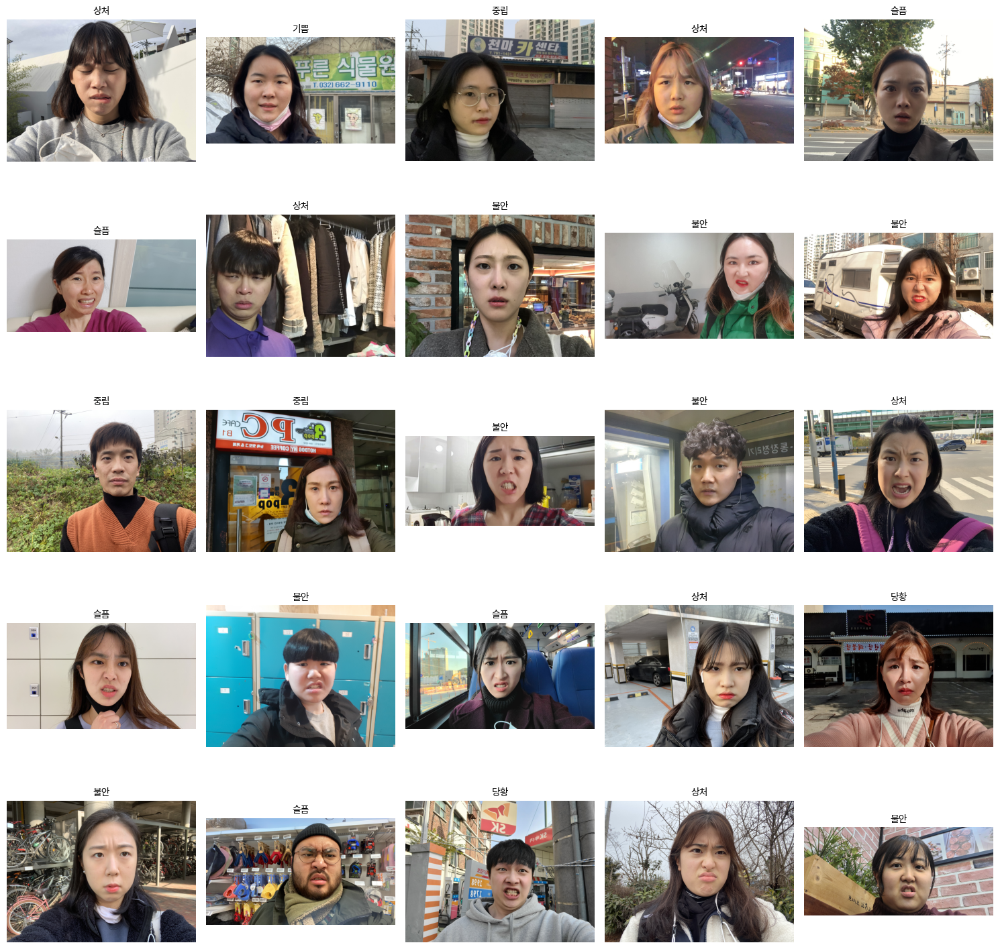

In [18]:
# 감정 정보가 다른 이미지 시각화
unique_filenames = df_train_not_anger['filename'].unique()

plt.figure(figsize=(15, 15))

for i, filename in enumerate(unique_filenames):
    if i >= 25:  # Show only the first 25 images for this example
        break
    image_path = os.path.join(train_img_path, 'anger', filename)
    if os.path.exists(image_path):  # Ensure the file exists
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.subplot(5, 5, i + 1)
        plt.imshow(image)
        faceExp = df_train_not_anger[df_train_not_anger['filename'] == filename]['faceExp'].iloc[0]
        plt.title(faceExp, fontproperties=fontprop)
        plt.axis('off')

plt.tight_layout()
plt.show()

##### 연령, 성별, 전문인 column 분포 확인

In [21]:
# 연령 분포 확인
df_train_anger['age'].value_counts()

age
20    2289
30    1572
40     483
50     102
10      42
60      12
Name: count, dtype: int64

In [22]:
# 성별 분포 확인
df_train_anger['gender'].value_counts()

gender
여    2412
남    2088
Name: count, dtype: int64

In [23]:
# 전문인 여부
df_train_anger['isProf'].value_counts()

isProf
일반인    2334
전문인    2166
Name: count, dtype: int64

##### 배경 정보 확인
- bg_uploader와 bg 차이 확인
- 배경 정보가 다른 이미지들 어떻게 처리할지

In [24]:
# 배경 정보
df_train_anger['bg_uploader'].value_counts(), df_train_anger['bg'].value_counts()

(bg_uploader
 상업시설/점포/시장           813
 숙박 및 거주공간            783
 공공시설/종교/의료시설         588
 도심 환경                567
 실외 자연환경              453
 교통/이동수단(엘리베이터 포함)    423
 문화재 및 유적지            243
 오락/공연시설              237
 스포츠 관람 및 레저시설        231
 행사/사무공간              162
 Name: count, dtype: int64,
 bg
 상업시설/점포/시장           849
 숙박 및 거주공간            800
 공공시설/종교/의료           748
 도심 환경                515
 실외 자연환경              470
 교통/이동수단(엘리베이터 포함)    358
 행사/사무공간              235
 오락/공연시설              211
 스포츠 관람 및 레저시설        152
 문화재 및 유적지            123
 공공시설/종교/의료시설          39
 Name: count, dtype: int64)

##### 박스 좌표 정보 확인
- 한 이미지 내 박스 좌표가 유사한지 시각화 및 좌표 수치 확인

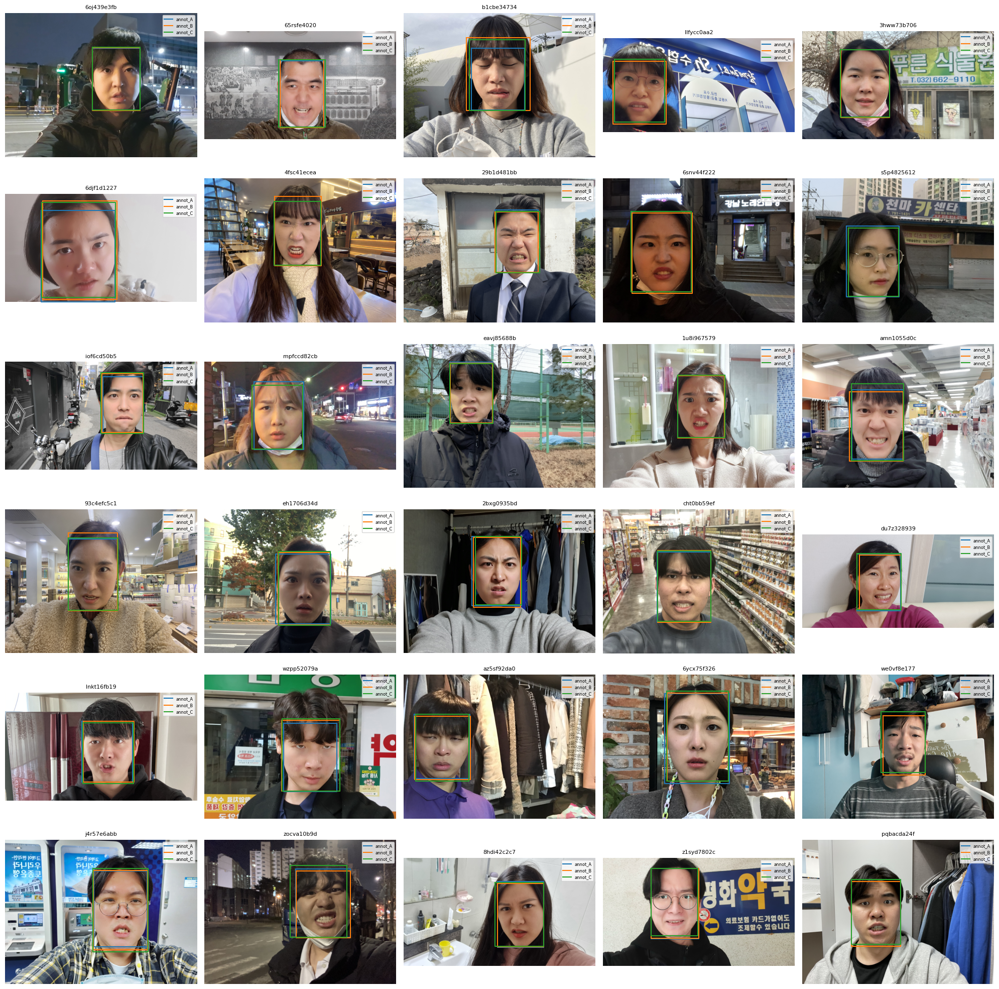

In [ ]:
# 이미지 & 박스 시각화

def visualize_boxes(data, image_dir):
    data = data[:30]  # 30개 이미지만 시각화
    fig, axes = plt.subplots(6, 5, figsize=(20, 20))
    axes = axes.ravel()

    for idx, item in enumerate(data):
        filename = item['filename']
        image_path = os.path.join(image_dir, filename)

        if not os.path.exists(image_path):
            print(f"Image {filename} not found in directory {image_dir}.")
            continue

        # Load image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        axes[idx].imshow(image) 
        axes[idx].axis('off')

        # Plot boxes from annotations
        for annot_key in ['annot_A', 'annot_B', 'annot_C']:
            if annot_key in item:
                box = item[annot_key]['boxes']
                x = [box['minX'], box['maxX'], box['maxX'], box['minX'], box['minX']]
                y = [box['minY'], box['minY'], box['maxY'], box['maxY'], box['minY']]
                axes[idx].plot(x, y, label=annot_key)

        axes[idx].set_title(filename[:10], fontsize=8)
        axes[idx].legend(fontsize=6)
       
    # Hide unused subplots
    for i in range(len(data), 30):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

visualize_boxes(json_anger, anger_img_path)

In [41]:
# 박스 좌표 수치 확인

# 임의로 10개의 파일 이름 선택
sample_filenames = df_train_anger['filename'].drop_duplicates().sample(n=10)

# 선택된 파일 이름에 대한 그룹 생성
sample_groups = df_train_anger[df_train_anger['filename'].isin(sample_filenames)]

# 같은 파일 이름끼리 그룹화
grouped = sample_groups.groupby('filename')

# 그룹 내 좌표 출력
for filename, group in grouped:
    print(f"Filename: {filename}")
    
    # 그룹 내 각 annot의 좌표 정보 출력
    for idx, row in group.iterrows():
        annot = row['annot']
        min_x, min_y, max_x, max_y = row['minX'], row['minY'], row['maxX'], row['maxY']
        print(f"  Annot: {annot}")
        print(f"    MinX: {min_x}, MinY: {min_y}")
        print(f"    MaxX: {max_x}, MaxY: {max_y}")
    
    print("-" * 30)

Filename: 369v0ae7376ecc4ec6d4c97c673744ee7acb2e376e53897ece7cca1a033a5xawi.jpg
  Annot: annot_A
    MinX: 2230.268023067007, MinY: 752.0096399999998
    MaxX: 3179.24462342188, MaxY: 1952.2869999999998
  Annot: annot_B
    MinX: 2204.87, MinY: 752.00964
    MaxX: 3186.4148000000005, MaxY: 1952.287
  Annot: annot_C
    MinX: 2204.87, MinY: 752.00964
    MaxX: 3186.4148, MaxY: 1952.287
------------------------------
Filename: 59iqed2d1b400f98298fe8021b0f71092970d9608750f26b768af38ad810cpoyx.jpg
  Annot: annot_A
    MinX: 1287.6945529911682, MinY: 815.7848127129105
    MaxX: 2327.781673324622, MaxY: 2136.5681399186687
  Annot: annot_B
    MinX: 1263.982766711814, MinY: 732.4247620137647
    MaxX: 2347.5145122355552, MaxY: 2120.454506407287
  Annot: annot_C
    MinX: 1255.966, MinY: 764.1516
    MaxX: 2323.6997, MaxY: 2116.5803
------------------------------
Filename: 9hw900b5b0ccd10b5b4ab3b9d4da75c47acbbbcdc0e57aabd2b9b720b0d008301.jpg
  Annot: annot_A
    MinX: 1059.5841, MinY: 201.7002